### **<font color='blue'> Stable Colorizer </font>**

#◢ DeOldify - Colorize your own photos!

####**Credits:**

Special thanks to:

Matt Robinson and María Benavente for pioneering the DeOldify image colab notebook.  

Dana Kelley for doing things, breaking stuff & having an opinion on everything.



---


#◢ Verify Correct Runtime Settings

**<font color='#FF000'> IMPORTANT </font>**

In the "Runtime" menu for the notebook window, select "Change runtime type." Ensure that the following are selected:
* Runtime Type = Python 3
* Hardware Accelerator = GPU 


#◢ Git clone and install DeOldify

In [1]:
!git clone https://github.com/jantic/DeOldify.git DeOldify 
%cd DeOldify

Cloning into 'DeOldify'...
remote: Enumerating objects: 2603, done.
remote: Counting objects: 100% (257/257), done.
remote: Compressing objects: 100% (180/180), done.
remote: Total 2603 (delta 83), reused 205 (delta 70), pack-reused 2346
Receiving objects: 100% (2603/2603), 69.71 MiB | 28.82 MiB/s, done.
Resolving deltas: 100% (1166/1166), done.
/content/DeOldify


#◢ Setup

In [6]:
!nvidia-smi

Tue May  9 00:42:48 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8     9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [5]:
#NOTE:  This must be the first call in order to work properly!
from deoldify import device
from deoldify.device_id import DeviceId
#choices:  CPU, GPU0...GPU7
device.set(device=DeviceId.GPU0)

import torch

if not torch.cuda.is_available():
    print('GPU not available.')

In [7]:
!pip install -qq -r requirements-colab.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 237.3/237.3 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 53.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 631.4/631.4 kB 55.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.0/354.0 kB 19.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 23.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 71.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 63.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 15.5 MB/s eta 0:00:00


In [8]:
import fastai
from deoldify.visualize import *

torch.backends.cudnn.benchmark = True

INFO:numexpr.utils:NumExpr defaulting to 2 threads.


NumExpr defaulting to 2 threads.


In [9]:
!mkdir 'models'
!wget --no-verbose https://www.dropbox.com/s/axsd2g85uyixaho/ColorizeStable_gen.pth?dl=0 -O ./models/ColorizeStable_gen.pth

mkdir: cannot create directory ‘models’: File exists
2023-05-09 00:43:55 URL:https://ucc69a02dc75cd150d8d8e3bea46.dl.dropboxusercontent.com/cd/0/inline2/B7sJk8ooPo7gF1qhcnhJpvSTpZraOoWhLU3W8awADQb14B0NhlP7-GJmAtmGcqVr6UrFwAejxNmwo57QOeA35kez3gY1xSoa607OfpaPsoFMXwgCY9akoW_5F0d069Qu0eK2VCsNorOLSk8t6VmFkfvqXuvm-uWPzAO4RDnJqGmj3NhUhGg4NEXwX8rgSbMz_Ah-I5gAufP0wJZXfAJjVM97OsWxDgg49JbRtop0XUZ0aMqkPArZHiAWeCS3cTwEnipXpB2KU8hSEghMO_aJ3iuAYgEc2d1Jo2BuOOxEwo1cltAbP-omqgw8Rj9w-6H2KeF4W5ifS_bYiDKQ2HCuHpLAtzutOLBQB5J2cPXr0xN2DgHDR3AMqsoUDVSmJVqfaTVMBCF9l8_2tC-CWYNrCN_HpYPIZXhMANYEy-oTF0FN0A/file [874066230/874066230] -> "./models/ColorizeStable_gen.pth" [1]


In [10]:
colorizer = get_image_colorizer(artistic=False)

/content/DeOldify/fastai/data_block.py:451: UserWarning: Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.
  warn("Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.")
/content/DeOldify/fastai/data_block.py:453: UserWarning: Your validation set is empty. If this is by design, use `split_none()`
                 or pass `ignore_empty=True` when labelling to remove this warning.
  warn("""Your validation set is empty. If this is by design, use `split_none()`
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  wa

#◢ Instructions

### source_url
Type in a url to a direct link of an image.  Usually that means they'll end in .png, .jpg, etc. NOTE: If you want to use your own image, upload it first to a site like Imgur. 

### render_factor
The default value of 35 has been carefully chosen and should work -ok- for most scenarios (but probably won't be the -best-). This determines resolution at which the color portion of the image is rendered. Lower resolution will render faster, and colors also tend to look more vibrant. Older and lower quality images in particular will generally benefit by lowering the render factor. Higher render factors are often better for higher quality images, but the colors may get slightly washed out. 

### watermarked
Selected by default, this places a watermark icon of a palette at the bottom left corner of the image.  This is intended to be a standard way to convey to others viewing the image that it is colorized by AI. We want to help promote this as a standard, especially as the technology continues to improve and the distinction between real and fake becomes harder to discern. This palette watermark practice was initiated and lead by the company MyHeritage in the MyHeritage In Color feature (which uses a newer version of DeOldify than what you're using here).

#### How to Download a Copy
Simply right click on the displayed image and click "Save image as..."!

## Pro Tips

You can evaluate how well the image is rendered at each render_factor by using the code at the bottom (that cell under "See how well render_factor values perform on a frame here"). 

#◢ Colorize from url!!

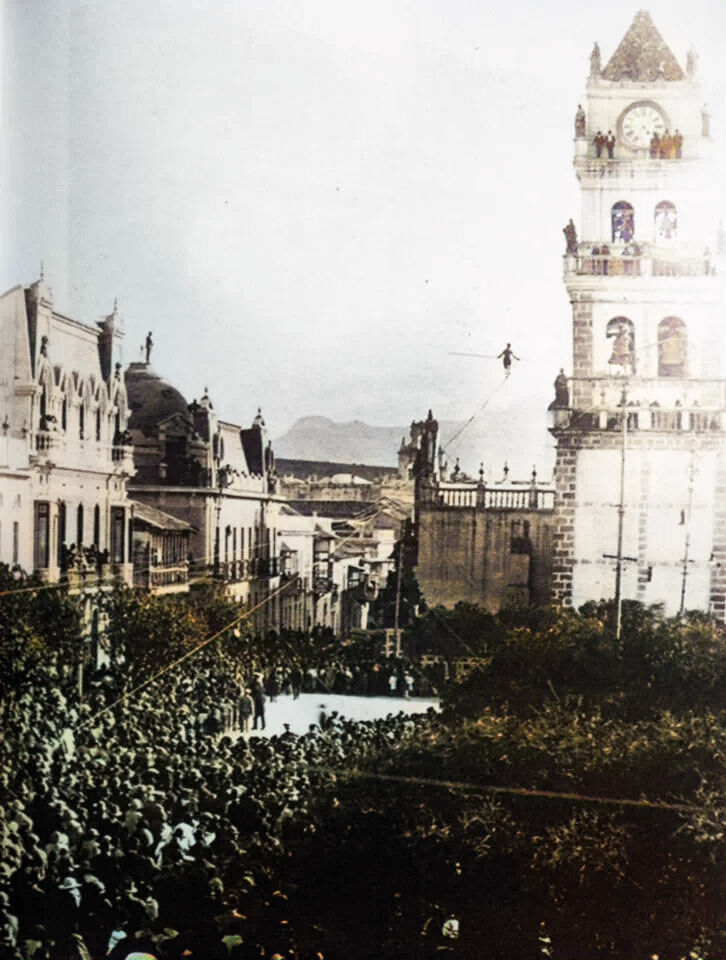

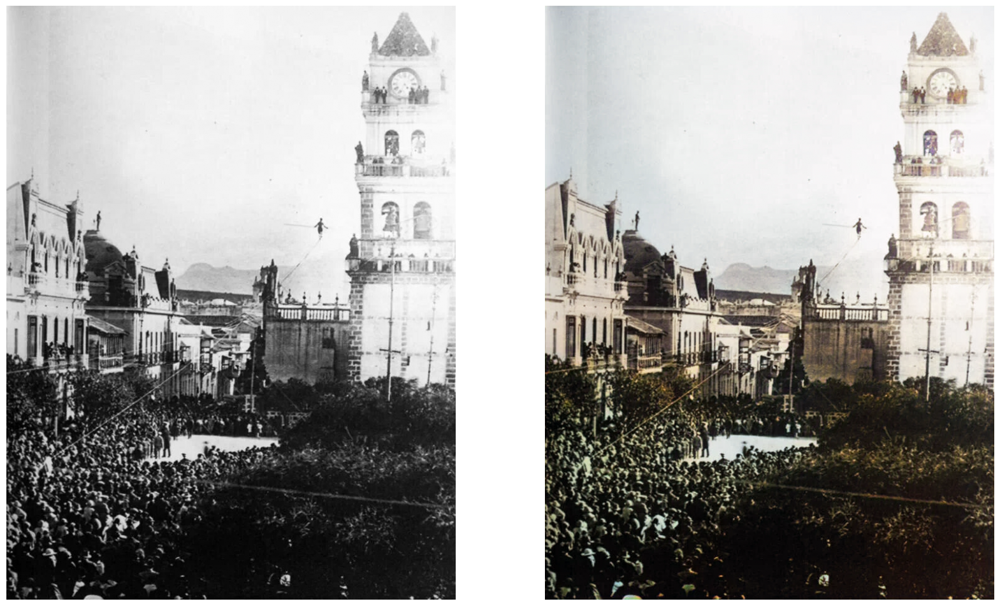

In [14]:
source_url = 'https://i.pinimg.com/736x/ba/82/1d/ba821d7b3db8c11dd76ae86a57bd179b--bolivia-sucre.jpg' #@param {type:"string"}
render_factor = 35  #@param {type: "slider", min: 7, max: 40}
watermarked = False #@param {type:"boolean"}

if source_url is not None and source_url !='':
    image_path = colorizer.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True, watermarked=watermarked)
    show_image_in_notebook(image_path)
else:
    print('Provide an image url and try again.')

#◢ Upload a File to be Colorized!!

In [18]:
help(colorizer.plot_transformed_image)
colorizer.plot_transformed_image('test_images/image.png', render_factor=i, display_render_factor=True, figsize=(8,8))


Help on method plot_transformed_image in module deoldify.visualize:

plot_transformed_image(path: str, results_dir: pathlib.Path = None, figsize: Tuple[int, int] = (20, 20), render_factor: int = None, display_render_factor: bool = False, compare: bool = False, post_process: bool = True, watermarked: bool = True) -> pathlib.Path method of deoldify.visualize.ModelImageVisualizer instance



In [15]:
#@title Run this cell for upload a file

render_factor = 35  #@param {type: "slider", min: 7, max: 40}
watermarked = False #@param {type:"boolean"}

colorizer.plot_transformed_image('test_images/image.png', render_factor=i, display_render_factor=True, figsize=(8,8))

if source_url is not None and source_url !='':
    image_path = colorizer.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True, watermarked=watermarked)
    show_image_in_notebook(image_path)
else:
    print('Provide an image url and try again.')

Help on ModelImageVisualizer in module deoldify.visualize object:

class ModelImageVisualizer(builtins.object)
 |  ModelImageVisualizer(filter: deoldify.filters.IFilter, results_dir: str = None)
 |  
 |  Methods defined here:
 |  
 |  __init__(self, filter: deoldify.filters.IFilter, results_dir: str = None)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  get_transformed_image(self, path: pathlib.Path, render_factor: int = None, post_process: bool = True, watermarked: bool = True) -> <module 'PIL.Image' from '/usr/local/lib/python3.10/dist-packages/PIL/Image.py'>
 |  
 |  plot_transformed_image(self, path: str, results_dir: pathlib.Path = None, figsize: Tuple[int, int] = (20, 20), render_factor: int = None, display_render_factor: bool = False, compare: bool = False, post_process: bool = True, watermarked: bool = True) -> pathlib.Path
 |  
 |  plot_transformed_image_from_url(self, url: str, path: str = 'test_images/image.png', results_dir: pathlib.Path = N

## See how well render_factor values perform on the image here

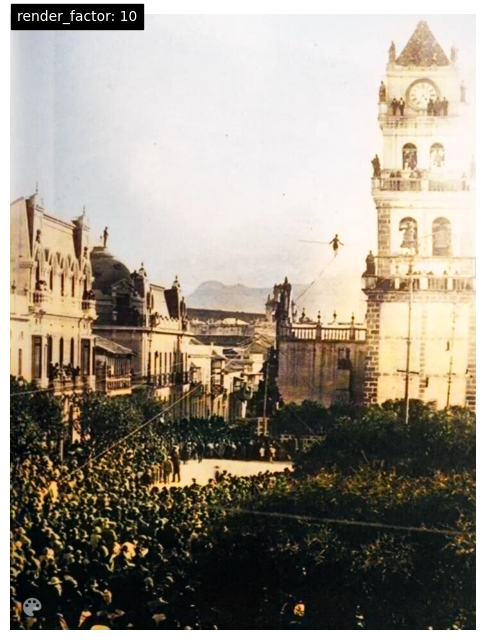

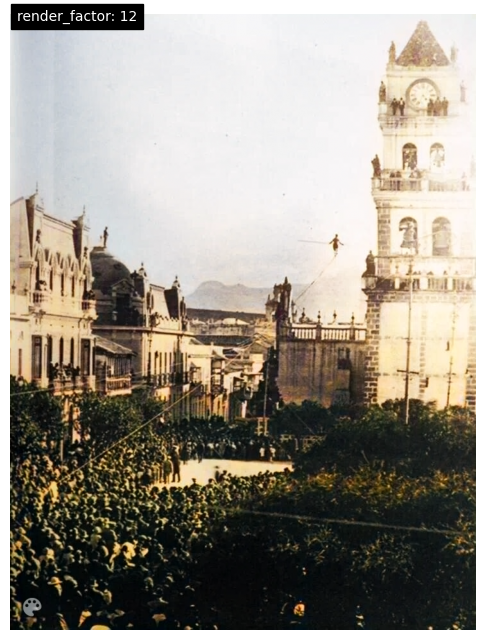

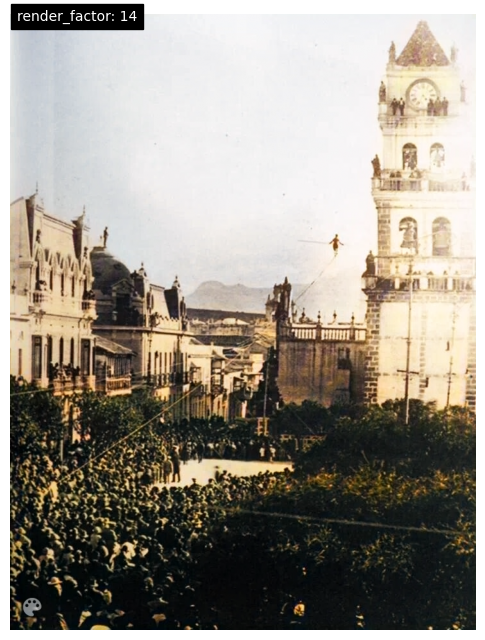

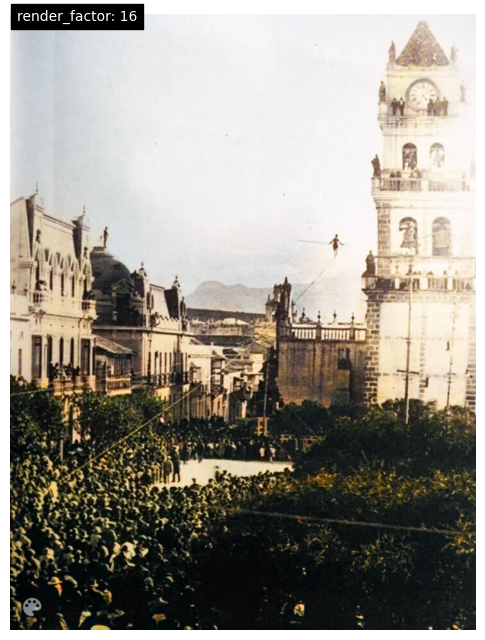

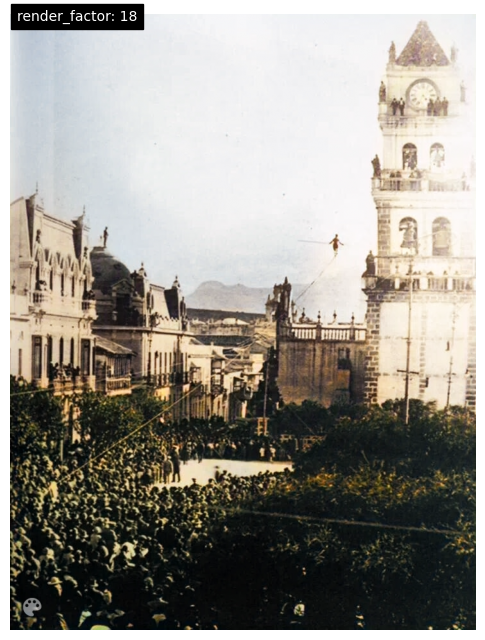

...

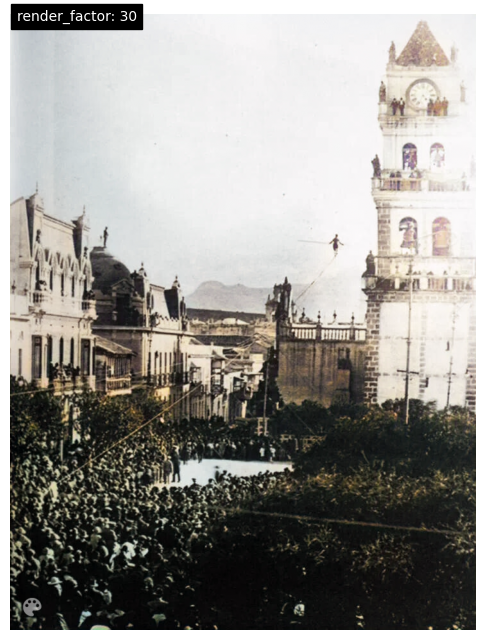

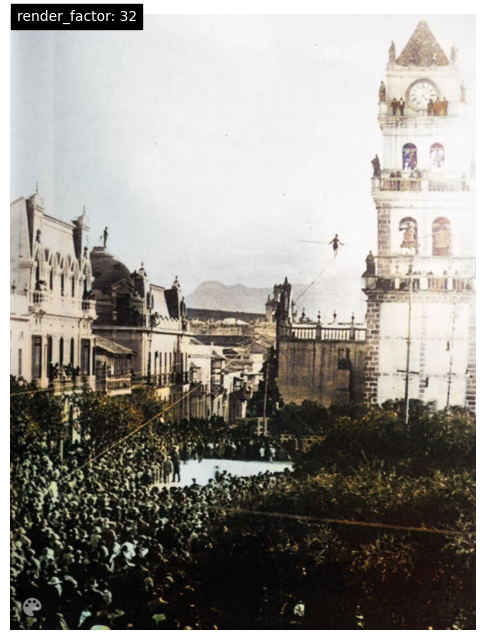

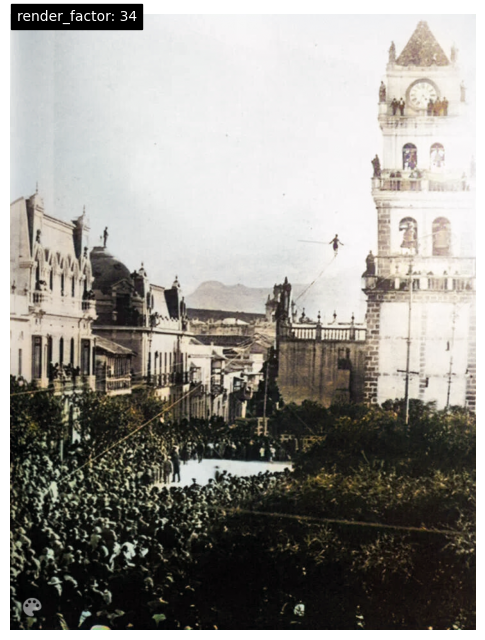

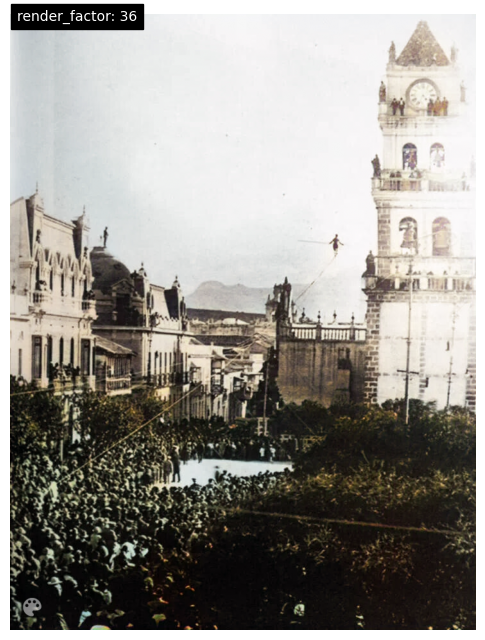

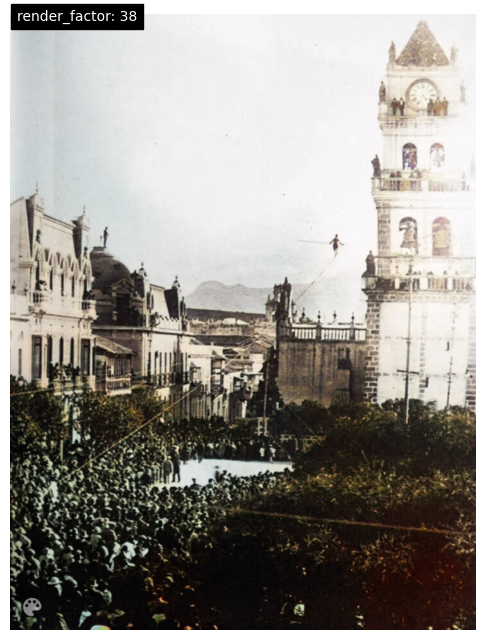

In [16]:
for i in range(10,40,2):
    colorizer.plot_transformed_image('test_images/image.png', render_factor=i, display_render_factor=True, figsize=(8,8))

---
#⚙ Recommended image sources 
* [/r/TheWayWeWere](https://www.reddit.com/r/TheWayWeWere/)